In [1]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

<strong>Problem Statemet -: <br> We need to predict the sales of different items in different outlets based on some other features</strong>

In [2]:
data = pd.read_csv('bigdatamart_Train.csv')
data.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


In [3]:
data.shape

(8523, 12)

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   object 
 1   Item_Weight                7060 non-null   float64
 2   Item_Fat_Content           8523 non-null   object 
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   object 
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   object 
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                6113 non-null   object 
 9   Outlet_Location_Type       8523 non-null   object 
 10  Outlet_Type                8523 non-null   object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1), object(7)
memory usage: 799.2+ KB


<strong>We have one int64, 7 object and 4 float64 variables.</strong>

<h3>Representation of Columns-:</h3>
    
<ul>
    <li>Item_Identifier -: Identifier of Item || Categorical</li>
    <li>Item_weight -: Weight of Item || Continuos</li>
    <li>Item_Fat_Content -: Fat Content of Item || Categorical</li>
    <li>Item_visibility -: Scale of visibility of Item (Greater meanas item is more visible) || Continuos</li>
    <li>Item_Type -: Type of Item , where the item can be used || Categorical</li>
    <li>Item_MRP -: MRP of Item || Continuos</li>
    <li>Outlet_Identifier -: Identifier of the outlet where the item is sold || Categorical</li>
    <li>Outlet_Establishment_Year -: When the outlet was established || Continuos</li>
    <li>Outlet_Size -: Size of Outlet || Categorical</li>
    <li>Outlet_Location_type -: Type of Location of Outlet || Categorical</li>
    <li>Outlet_Type -: Type of Outlet || Categorical </li>
    <li>Item_outlet_sales -: Sales of the particular Item in that outlet || Continuos || Outcome Variable</li>
</ul>
<strong>As we are predicting a continuos varaible, we are dealing here with a regreesion Problem</strong>

<h3>Checking for NULL Values</h3>

In [5]:
data.isnull().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

<strong>There are null values in our dataset. Let's analyse further if imputing these values would be better, or just dropping them, or are these rows really contributing to the dataset. Dataset cleaning will be done after EDA</strong>

In [6]:
data.nunique()

Item_Identifier              1559
Item_Weight                   415
Item_Fat_Content                5
Item_Visibility              7880
Item_Type                      16
Item_MRP                     5938
Outlet_Identifier              10
Outlet_Establishment_Year       9
Outlet_Size                     3
Outlet_Location_Type            3
Outlet_Type                     4
Item_Outlet_Sales            3493
dtype: int64

<strong>What we see above is outlet_establishment_year has only 9 unique values, we can use it as a categorical variable. Also we might think that outlet_establishment_year is not adding any value to the dataset as we already have outlet identifier which might work in same way as outlet_establishment_year </strong>

<h3>EXPLORATPRY DATA ANALYSIS</h3>

<h4>ScatterPlots</h4>

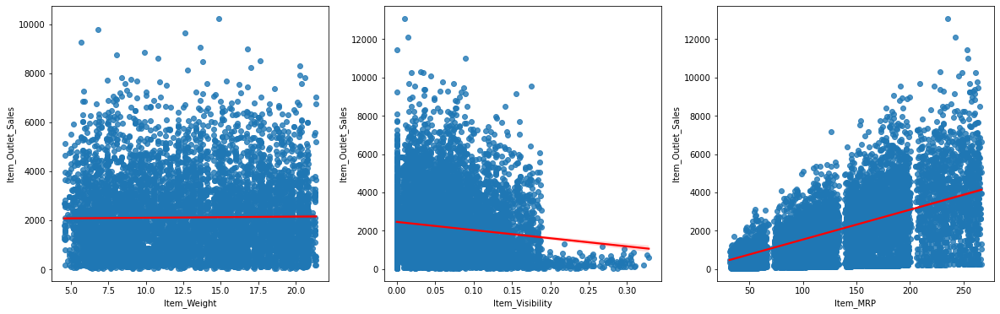

In [7]:
numerical_cols = ['Item_Weight', 'Item_Visibility', 'Item_MRP']
plt.figure(figsize=(20,6))
plotnumber=1
for i in data[numerical_cols].columns:
    plt.subplot(1,3, plotnumber)
    sns.regplot(i, 'Item_Outlet_Sales', data=data, line_kws={'color':'red'})
    plotnumber+=1

<strong>We can see that Item weight has No trend with the sales of that item. Item visibility has  a negative trend and it almost declines bny 1/10th when visibility is greater than 0.20. item_MRP has a positive trend with Item_outlet_sales</strong>

<h4>STRIP PLOTS</h4>

In [8]:
categorical_cols = [col for col in data.columns if col not in numerical_cols and col != 'Item_Outlet_Sales']

In [9]:
categorical_cols

['Item_Identifier',
 'Item_Fat_Content',
 'Item_Type',
 'Outlet_Identifier',
 'Outlet_Establishment_Year',
 'Outlet_Size',
 'Outlet_Location_Type',
 'Outlet_Type']

<strong>As we have 1559 distinct values for Item_Identifier. We will need a very big Screen ot interpret the result of these many classes, so not plotting for this variable</strong>

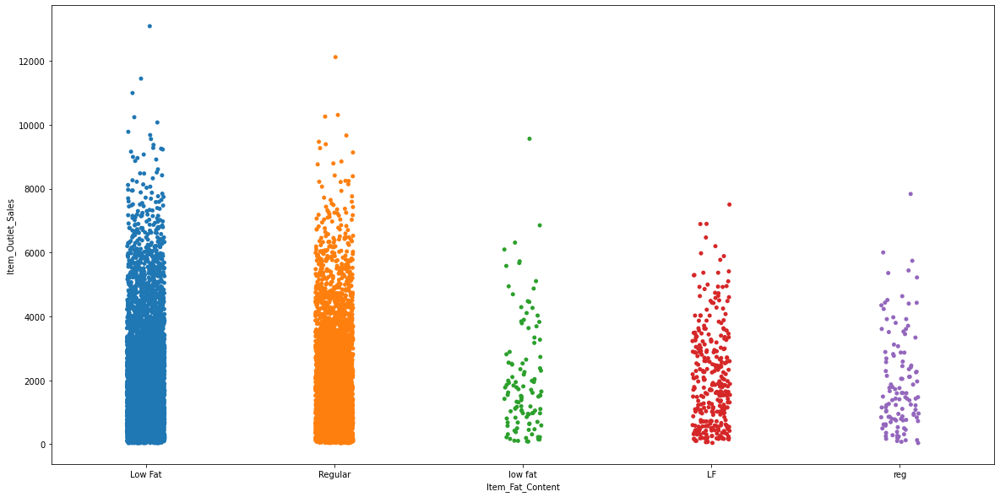

In [10]:
plt.figure(figsize=(20,10))
sns.stripplot('Item_Fat_Content', 'Item_Outlet_Sales', data=data)

<strong>Here we can see there are 5 different classes, but if we look at their names we can see that low fat and LF also represet Low Fat, while reg represents Regular. We need to replace these addition values with their original names</strong>

In [11]:
data['Item_Fat_Content'] = data['Item_Fat_Content'].replace({'low fat':'Low Fat', 'LF':'Low Fat', 'reg':'Regular'})

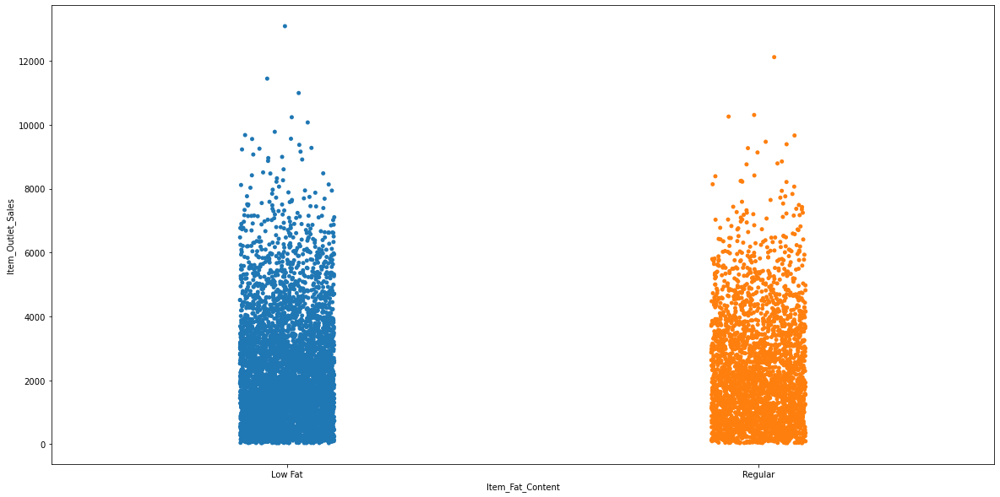

In [12]:
plt.figure(figsize=(20,10))
sns.stripplot('Item_Fat_Content', 'Item_Outlet_Sales', data=data)

<strong>We can see that items with low fat Content have slightly higher sales than items with regular fat</strong>

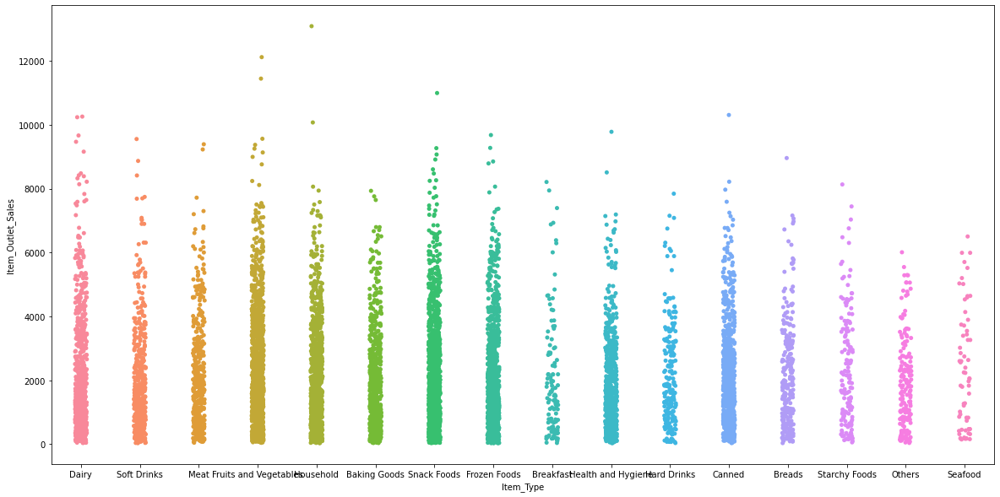

In [13]:
plt.figure(figsize=(20,10))
sns.stripplot('Item_Type', 'Item_Outlet_Sales', data=data)

<strong>We can see that dairy items, Fruits and vegetables, Household, snack foodsm Frozen fooods, Health and Hygience, Canned haeve slightly higher sales, while Others, Seafood and high drinks have slightly less sales. All other types have moderate sales. </strong>

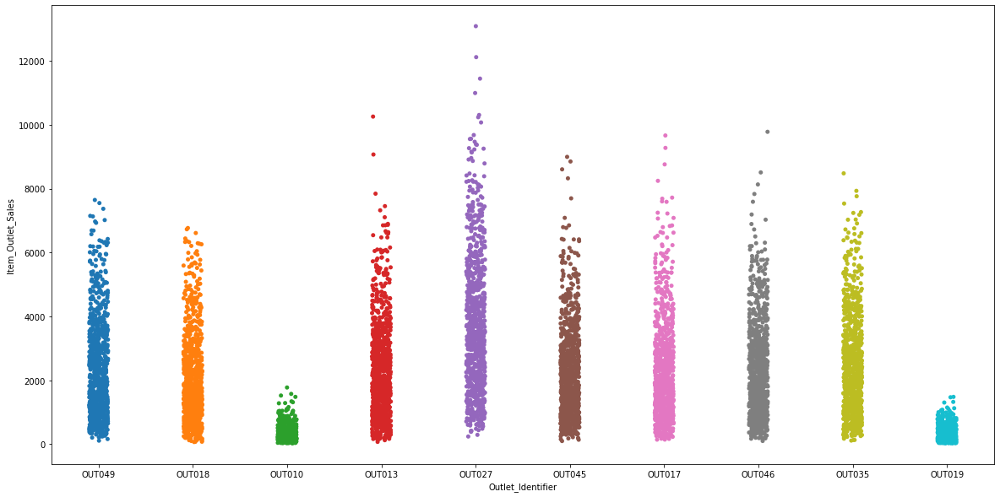

In [14]:
plt.figure(figsize=(20,10))
sns.stripplot('Outlet_Identifier', 'Item_Outlet_Sales', data=data)

<strong>OUT027 and OUT017 have slightly high sales, while OUT019 and OUT010 have very low sales, rest all have moderate Sales</strong>

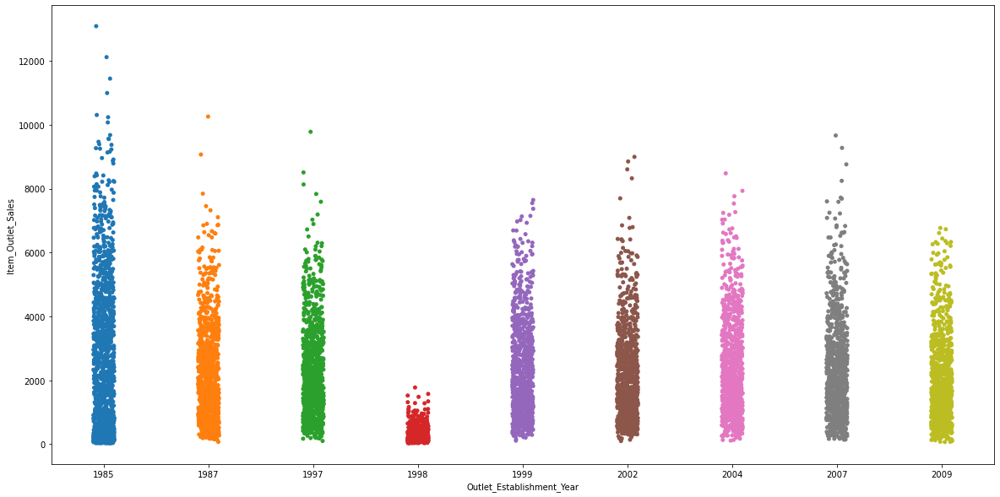

In [15]:
plt.figure(figsize=(20,10))
sns.stripplot('Outlet_Establishment_Year', 'Item_Outlet_Sales', data=data)

<strong>Outlest Established in Year 1998 have lowest sales. Comparing with the outlet Identifier plot we can say tha outlet 019 and 010 were established in the year 1998. OUT027 was probably establioshed in 1985. There were 9 unique values in Years and 10 in outlet identifier and as we already identified that outlet 019 and 010 were established in the year 1998, so in all other years only one outlet was established. And since when they established two outlets the sales in those outlets were dropped significatntly, we can say that the company should not try to establish more than one outlet in an year.<br> Also we can say that the year column is not contributing much to the outcome as it gives almost same thing as outlet identifiers are giving</strong>

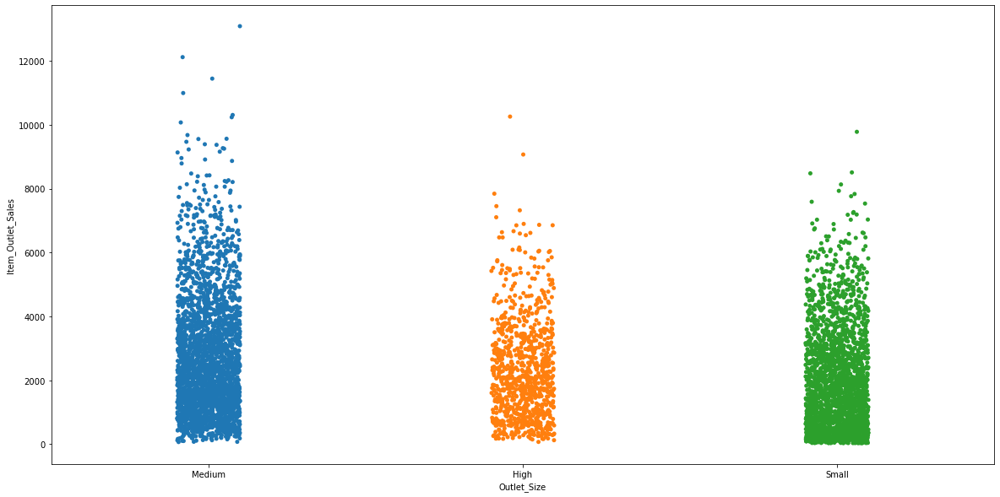

In [16]:
plt.figure(figsize=(20,10))
sns.stripplot('Outlet_Size', 'Item_Outlet_Sales', data=data)

<strong>Medium Size Outlets have highest number of sales, followed by small size, while High size has lowest sales.</strong>

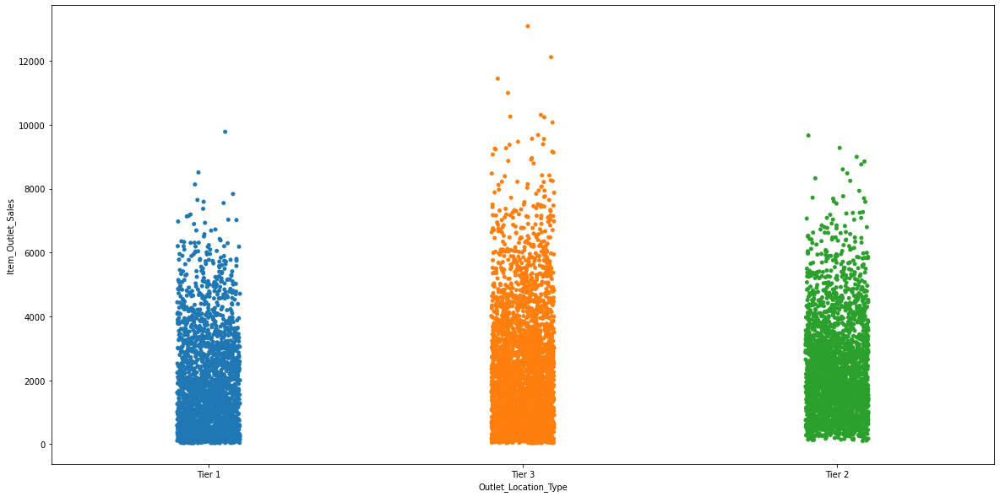

In [17]:
plt.figure(figsize=(20,10))
sns.stripplot('Outlet_Location_Type', 'Item_Outlet_Sales', data=data)

<strong>Tier 3 Location have highest sales followed by Ties 2 and Tier 1, we can consider this variable as nominal</strong>

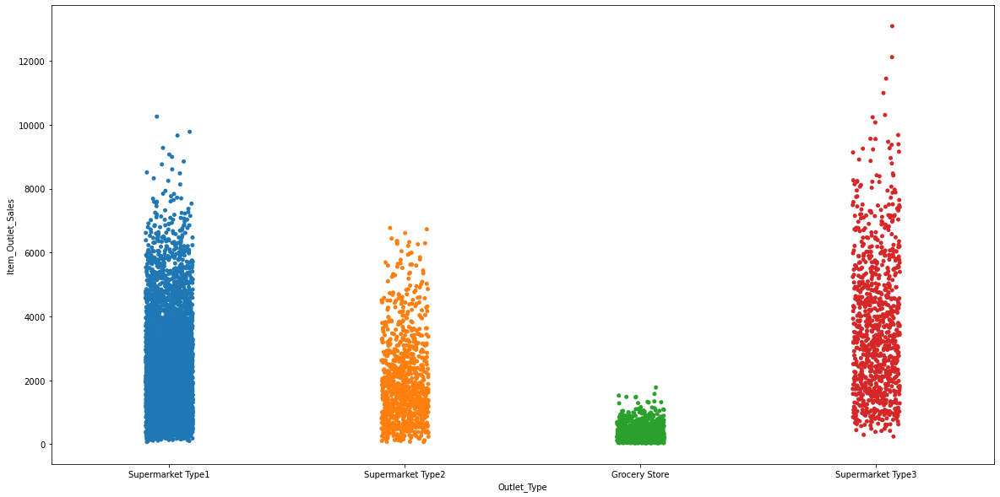

In [18]:
plt.figure(figsize=(20,10))
sns.stripplot('Outlet_Type', 'Item_Outlet_Sales', data=data)

<strong>Grocery Store has lowest sales, Supermarket Type 3 has highest Sales. This can also be interpreted as Ordinal</strong>

<h3>Mean Sales according to different Variables</h3>

In [19]:
data['Outlet_Type'].unique()

array(['Supermarket Type1', 'Supermarket Type2', 'Grocery Store',
       'Supermarket Type3'], dtype=object)

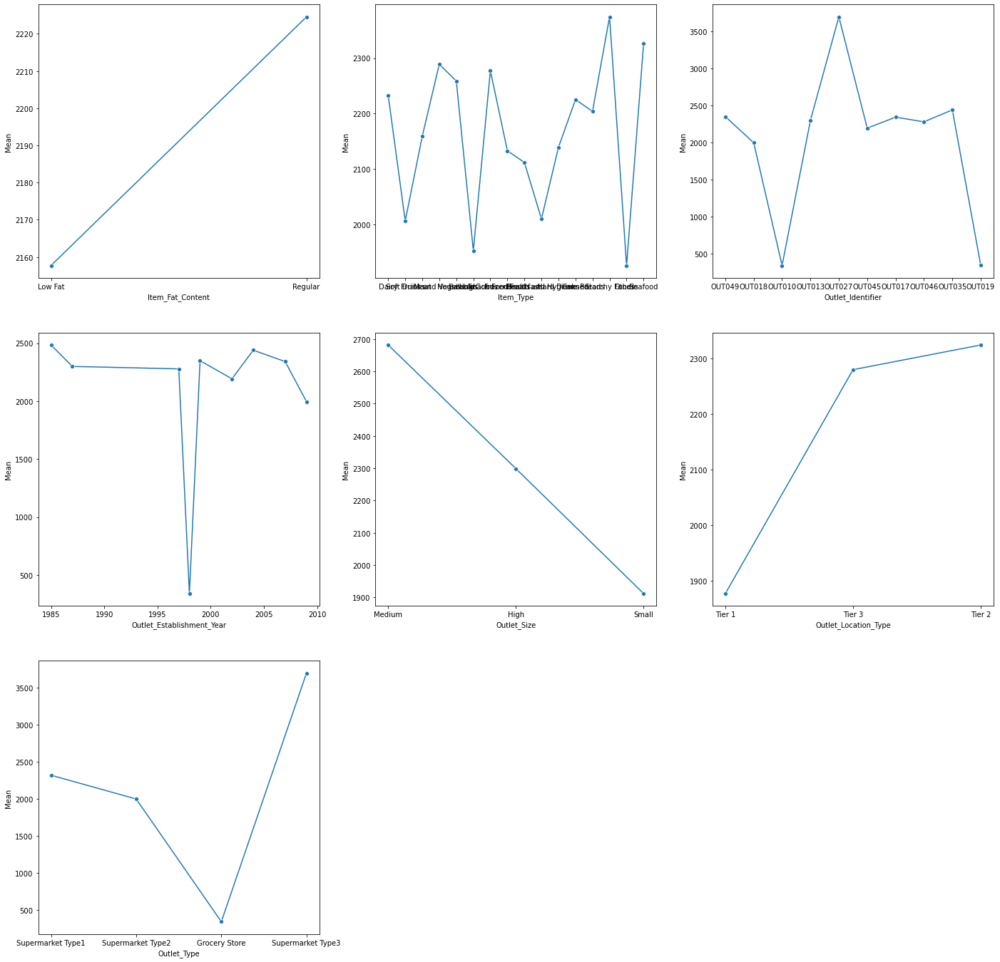

In [20]:
plt.figure(figsize=(24,24))
plotnumber = 1
for col in categorical_cols:
    mean_vals = pd.DataFrame()
    if col == 'Item_Identifier':
        continue
    unique_val = data[col].unique().tolist()
    means = []
    for val in unique_val:
        mean_val = data[data[col] == val]
        mean_val = mean_val['Item_Outlet_Sales'].mean()
        means.append(mean_val)
    mean_vals['Values'] = unique_val
    mean_vals['Mean'] = means
    plt.subplot(3,3, plotnumber)
    sns.lineplot(x='Values', y='Mean', data=mean_vals, marker='o')
    plt.xlabel(col)
    plotnumber+=1

<strong>The plot of mean for different Variables also verifies the interpretation we made from stipplots</strong>

<h4>KDE PLOT of outcome variables base on various categorical variablees.</h4>

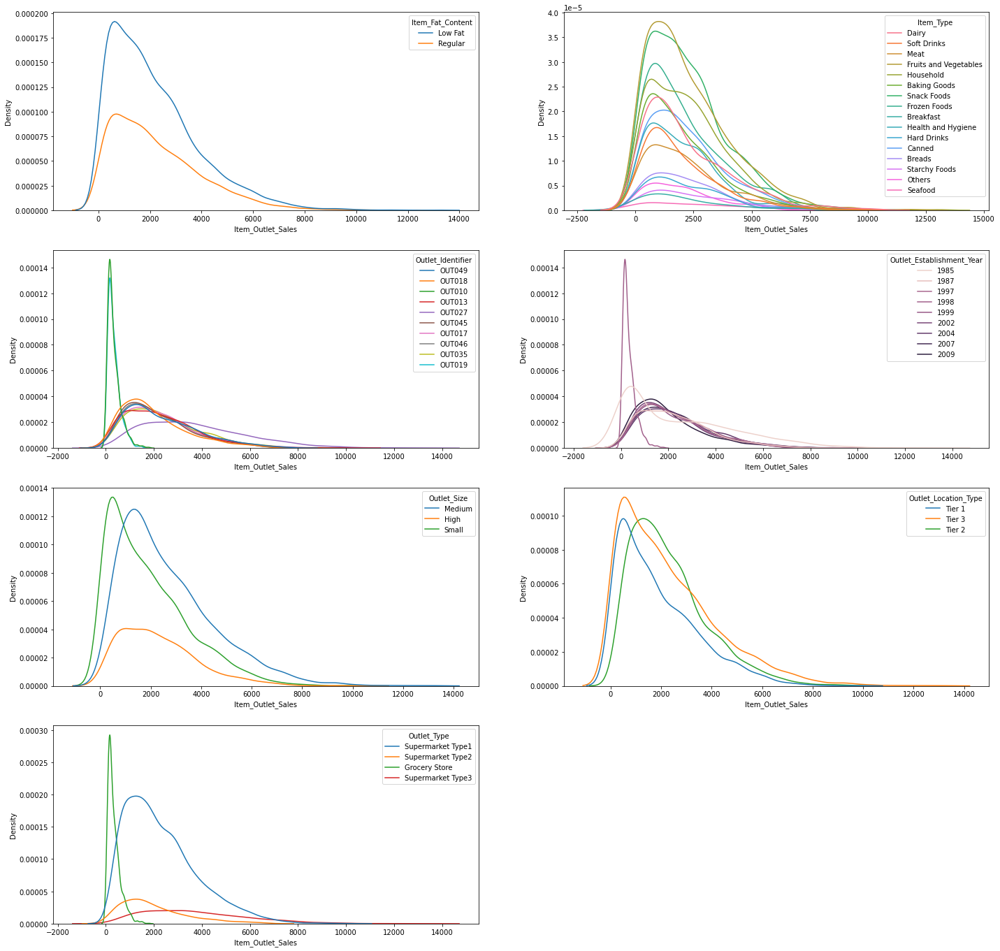

In [21]:
plt.figure(figsize=(24, 24))
plotnumber = 1
for col in categorical_cols:
    if col == 'Item_Identifier':
        continue
    plt.subplot(4,2,plotnumber)
    sns.kdeplot('Item_Outlet_Sales', hue=col, data=data)
    plotnumber+=1

<strong>Sales are fairly left skewed in alomst all categories</strong>
<ul>
    <li>Location of Outlet acffects the sales very slightly. Tier 2 have slightly more sales than Tier 1 adn Tier 3</li>
    <li>Grocery Store have low sales compared to Supermarket Type 1 and Suermarket Type 2. Supermarket Type 3 have Highest Sales as the plot is more dense tworards the center.</li>
    <li>Samll outletr Size have low sales as the plot is more dense towards 0. Medium outlet size have slightly higher sales than small outlet size as the plot is slightly more dense away from zero. High outlet size sales are more in between samll and medium.</li>
    <li>Outlet 010 and  oUT019 have lowest sales as they are more dnese close towards zero, this was also seen in earlier analysis. OUT027 have highest sales as it is more dense towards the center</li>
    <li>Outlets established in the year 1998 and 1987 have low sales as they are more dense towards zero, outlets establishd in the rest of the years have fairly even density among themselves</li>
    <li>Fat content does not have much effect on sales.</li>
</ul>


<h4>Plot of Continuos Variables accoridng to different classes of categorical Variables </h4>

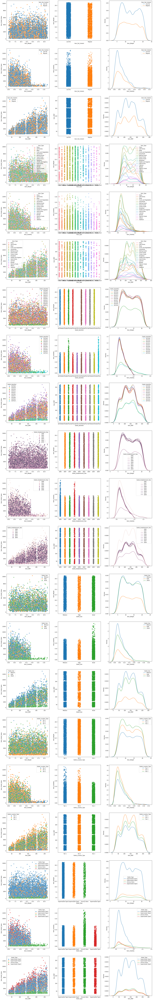

In [22]:
plt.figure(figsize=(24, 168))
plotnumber = 1
for col in categorical_cols:
    if col == 'Item_Identifier':
        continue
    for num in numerical_cols:
        plt.subplot(21,3,plotnumber)
        plotnumber+=1
        sns.scatterplot(num, "Item_Outlet_Sales", data=data, hue=col)
        plt.subplot(21,3,plotnumber)
        sns.stripplot(col, num, data=data)
        plotnumber+=1
        plt.subplot(21,3, plotnumber)
        sns.kdeplot(num,hue=col, data=data)
        plotnumber+=1

<strong>You might think that why we have done so much plotting, but from this plotting, we got two major insights.<br> First one is that the items in OUT027 and OUT019 have no values for weights, meaning that weight is not mweasured in these outlets. <br> Another is that Supermarket Type 3 has no values for weights, which again means that no weight is measured in supermarket type 3 </strong>


<strong>
    <ul>
        <li>If we Look at the graphs of Item Fat Content
            <ul>
                <li>There are more low fat content items than Regular Fat Content Items. Not much difference in MRP, and no significatn relationship between numerical variables and outcome varibales based on Fat Content as a Factor</li>
            </ul>
        </li>
        <li>If we look at the graphs of Item Type
            <ul>
                <li>Seafoods and hard drinks are less dense compared to other variables.</li>
                <li>Meaning of less sale of seafood items and Hard drinks could be the fact that there stock is kept low in the outlets.</li>
            </ul>
        </li>
        <li>If we look at the graphs of Outlet Identifier
            <ul>
                <li>OUT027 and 0UT19 have no values of avaialable for Item weight and above we have seen that OUT019 have lowest sales and OUT027 have highest, meaning we should not impute the missing values of Item Weight as we will be handling tow extremes from our analysis. We can go on and delete the Item weight column as it is also not relaying much infromation about sales.</li>
                <li>If we look at the density plots we could see that all outlets have highest density at the same point, meaning these 3 numerical factors have not much to do with the low sales of some outlets, the reson for their low sales could be their location or store type, OR they are not actucally selling less, they might be selling good according to their own capacity. For example if you compare BIG BAZAR to some local grocery store, BIG BAZAR would obviously have high sales compared to local grocery store, but that does not mean that the local grocery store is performing bad.</li>
                <li></li>
            </ul>
        </li>
        <li>Outlet established in the year 1985 have no value for weights</li>
        <li>Supermarket type 3 has no values for weights</li>
        <li>Small size outlets have high visibility compared to high and medium size outlets.</li>
        <li>Tier 1 and Tier 3 have high visibility compared to Tier 2 Outlets</li>
        <li>Grocry store have high visibiltity compared to other type of Stores</li>
        <li>OUT010 and OUT019 have high visibility</li> <li>year 1985 and year 1998 have high visibility</li>
    </ul>
</strong>

<h4>Countplots of differnet categories</h4>

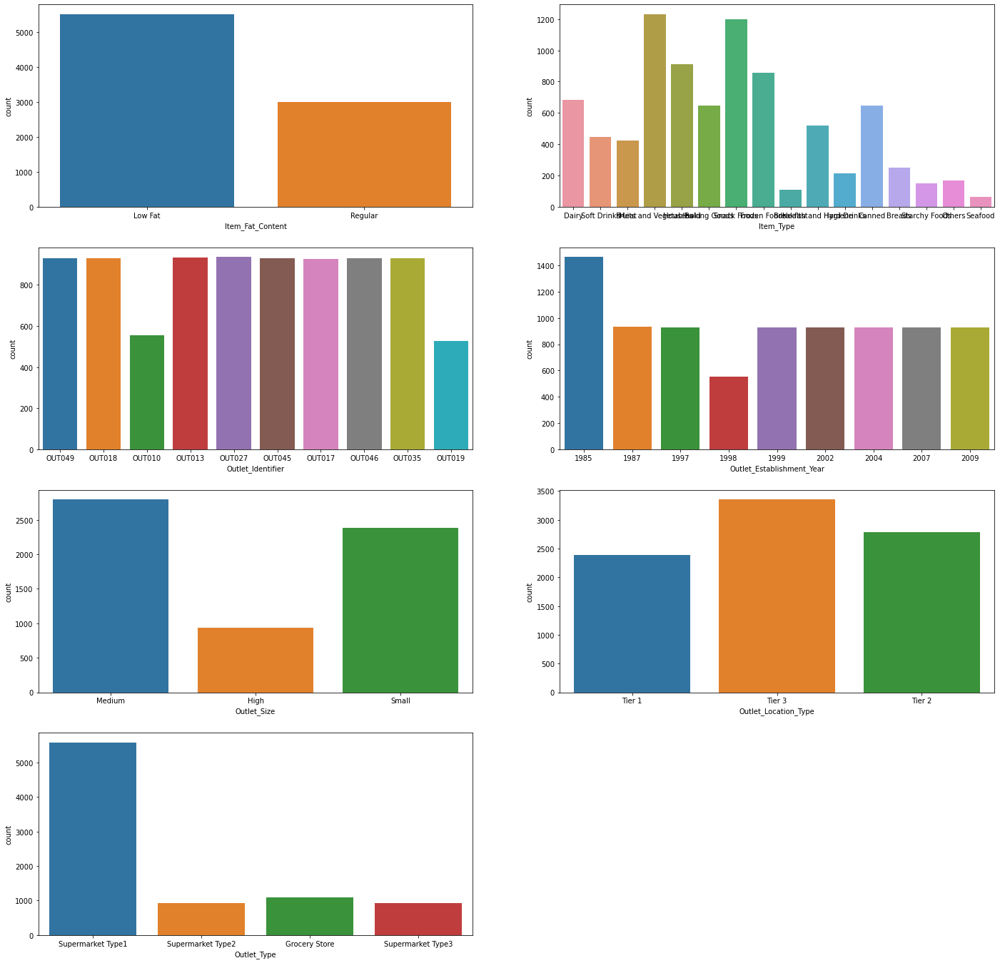

In [23]:
plt.figure(figsize=(24, 24))
plotnumber = 1
for col in categorical_cols:
    if col == 'Item_Identifier':
        continue
    plt.subplot(4,2,plotnumber)
    sns.countplot(x=col, data=data)
    plotnumber+=1

<h4>Pairplot</h4>

<Figure size 1080x1080 with 0 Axes>

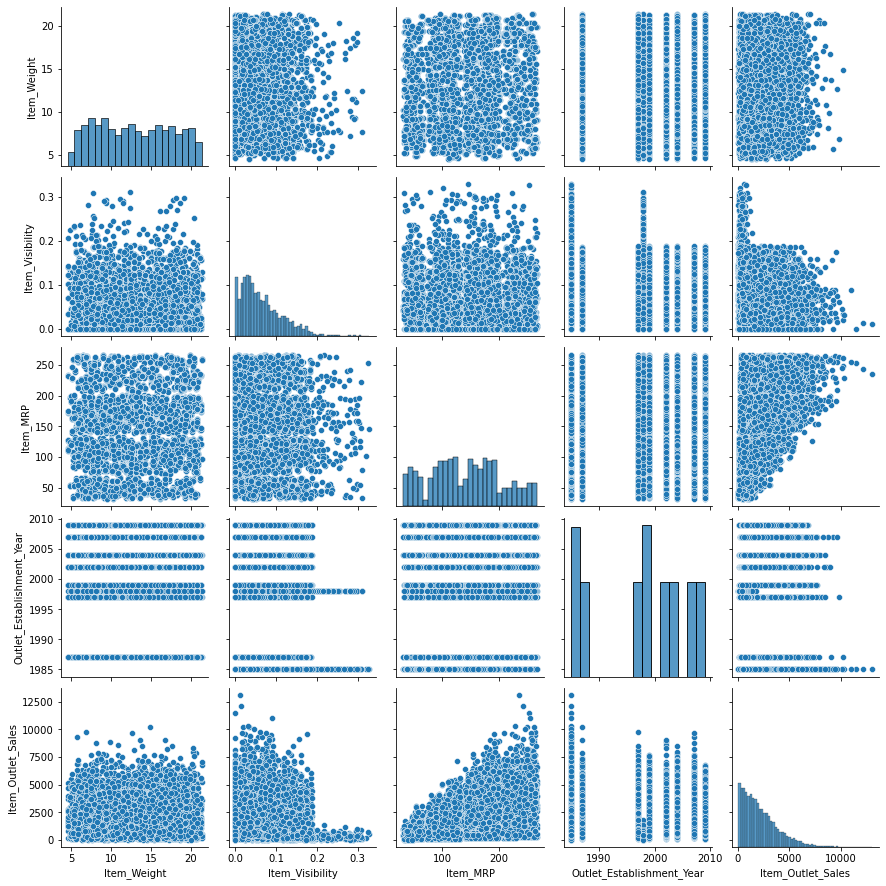

In [24]:
plt.figure(figsize=(15,15))
sns.pairplot(data)
plt.show()

<strong>No clear correlation among feature varaibles could be interpreted. Negative correlation of Item_visibility with Sales and postive correlation of Item MRP with sales. This was already interpretd in scatterplots</strong>

<h4>Correlation Matrix<h4>

In [25]:
data.corr()

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
Item_Weight,1.000000,-0.014048,0.027141,-0.011588,0.014123
Item_Visibility,-0.014048,1.000000,-0.001315,-0.074834,-0.128625
Item_MRP,0.027141,-0.001315,1.000000,0.005020,0.567574
Outlet_Establishment_Year,-0.011588,-0.074834,0.005020,1.000000,-0.049135
Item_Outlet_Sales,0.014123,-0.128625,0.567574,-0.049135,1.000000


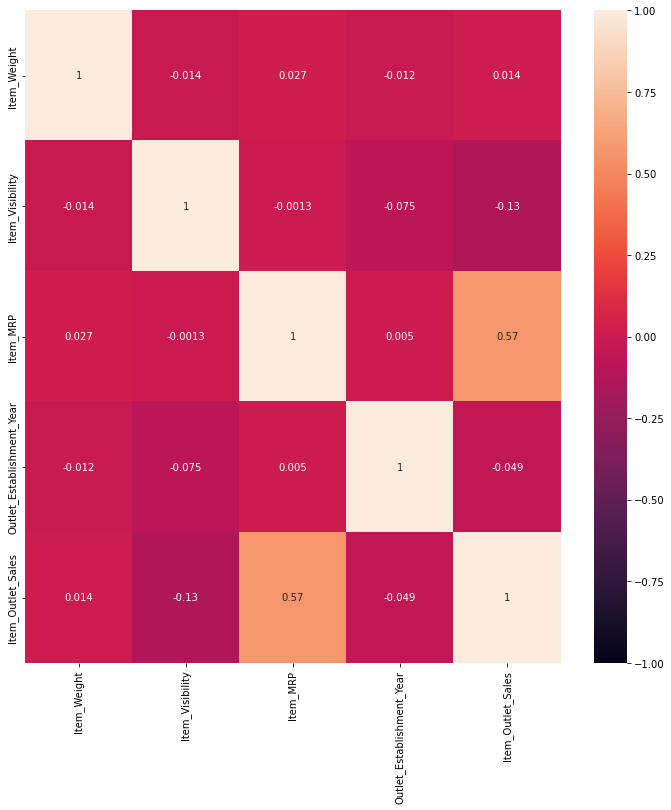

In [26]:
plt.figure(figsize=(12,12))
sns.heatmap(data.corr(), annot=True, vmin=-1, vmax=1)

<h4>Outcome of Correlation Matrix</h4>
<strong>
    <ul>
        <li>Item MRP has correlatiion of 57% with Sales</li>
        <li>Item Visibility has correlation of 13% with Sales</li>
        <li>item weighth has correlation of 1.4% with sales</li>
    </ul>
</strong>

<strong>We cna say that there will be no problem of multicollinearity</strong>

<h4>Converting Year to categorical</h4>

In [27]:
convert_dict = {
    'Outlet_Establishment_Year':str
}
data = data.astype(convert_dict)

In [28]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   object 
 1   Item_Weight                7060 non-null   float64
 2   Item_Fat_Content           8523 non-null   object 
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   object 
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   object 
 7   Outlet_Establishment_Year  8523 non-null   object 
 8   Outlet_Size                6113 non-null   object 
 9   Outlet_Location_Type       8523 non-null   object 
 10  Outlet_Type                8523 non-null   object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), object(8)
memory usage: 799.2+ KB


<h4>Dropping Item_Weight column</h4>

In [29]:
data = data.drop(columns=['Item_Weight'])

<h4>Descriptive Statistics</h4>

In [30]:
data.describe()

,Item_Visibility,Item_MRP,Item_Outlet_Sales
count,8523.000000,8523.000000,8523.000000
mean,0.066132,140.992782,2181.288914
std,0.051598,62.275067,1706.499616
min,0.000000,31.290000,33.290000
25%,0.026989,93.826500,834.247400
50%,0.053931,143.012800,1794.331000
75%,0.094585,185.643700,3101.296400
max,0.328391,266.888400,13086.964800


Outcome of Descriptive Statistics
<ul>
    <li>Item_Visibility
        <ul>
            <li>Mean -: 0.066</li>
            <li>STD -: 0.05</li>
            <li>Min -: 0.00</li>
            <li>Max -: 0.32</li>
        </ul>
    </li>
    <li>Item_MRP
        <ul>
            <li>Mean -: 140.99</li>
            <li>STD -: 62.27</li>
            <li>Min -: 31.29</li>
            <li>Max -: 266.88</li>
        </ul>
    </li>
    <li>Item_Outlet_Sales (Target Variable)
        <ul>
            <li>Mean -: 2181.28</li>
            <li>STD -: 1706.49</li>
            <li>Min -: 33.29</li>
            <li>Max -: 13086.96</li>
        </ul>
    </li>
</ul>

<h3>Handling Outliers</h3>

<h3>Boxplot of Numerical Variables</h3>

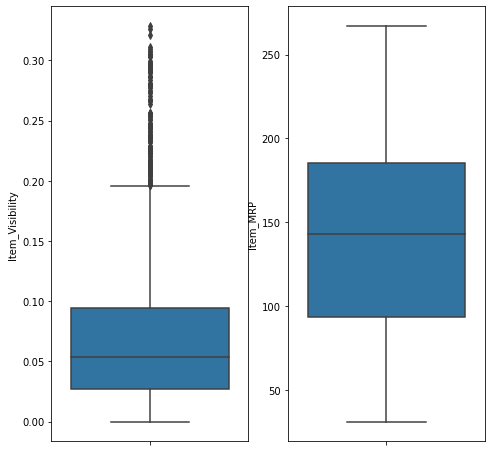

In [31]:
plt.figure(figsize=(12,8))
numerical_cols = ['Item_Visibility', 'Item_MRP']
plotnumber=1
for i in numerical_cols:
    plt.subplot(1,3,plotnumber)
    sns.boxplot(y=data[i])
    plotnumber+=1
    

<strong>item Visibility have more number of  outliers</strong>

In [32]:
X = data.drop(columns=categorical_cols).drop(columns=['Item_Outlet_Sales'])
print(X.shape)

(8523, 2)


In [33]:
from scipy.stats import zscore
z = np.abs(zscore(X))
z.shape

(8523, 2)

In [34]:
print(len(np.where(z>3)[0]))

95


<strong>We need to drop 95 rows</strong>

<h3>Distribution Plot</h3>

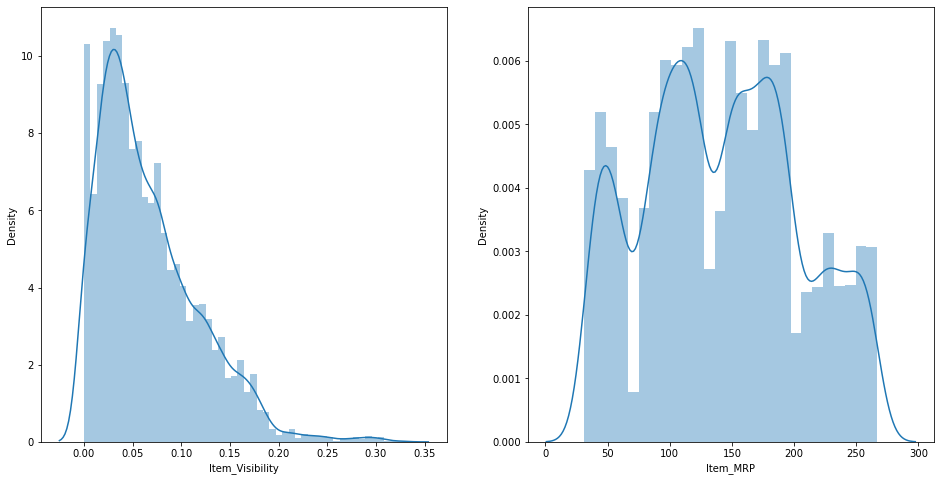

In [35]:
plotnumber=1
plt.figure(figsize=(16,8))
for col in X:
    plt.subplot(1,2, plotnumber)
    sns.distplot(X[col])
    plotnumber+=1

<strong>Item Visibiltiy is skewed to left. Item MRP is close to normal</strong>

In [36]:
X.skew()

Item_Visibility    1.167091
Item_MRP           0.127202
dtype: float64

<h4>Deleting Outliers</h4>

In [37]:
from sklearn

Old Shape (8523, 11)
New Shape (8428, 11)
Total Dropped Rows 95


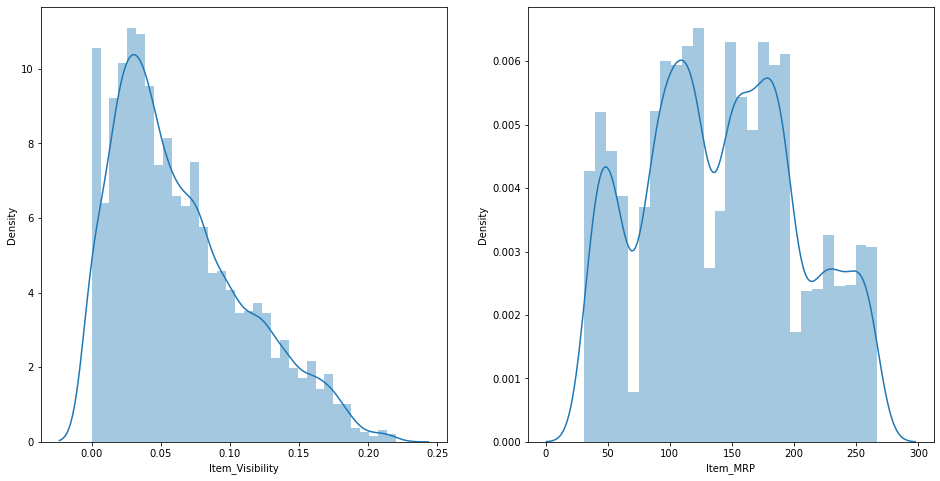

In [38]:
numerical_cols = ['Item_Visibility','Item_MRP']
plotnumber=1
plt.figure(figsize=(16,8))
for col in numerical_cols:
    plt.subplot(1,2, plotnumber)
    sns.distplot(data_new[col])
    plotnumber+=1

In [39]:
data_new[numerical_cols].skew()

Item_Visibility    0.795956
Item_MRP           0.128945
dtype: float64

<strong>We have managed to remove some of the skew</strong>

<h4>Power Transformation to Remove Remaining Skew</h4>

In [40]:
from sklearn.preprocessing import power_transform

for col in numerical_cols:
    data_new[col] = power_transform(np.array(data_new[col]).reshape(-1,1), method='yeo-johnson').reshape(8428,)

In [41]:
data_new[numerical_cols].skew()

Item_Visibility    0.115444
Item_MRP          -0.114976
dtype: float64

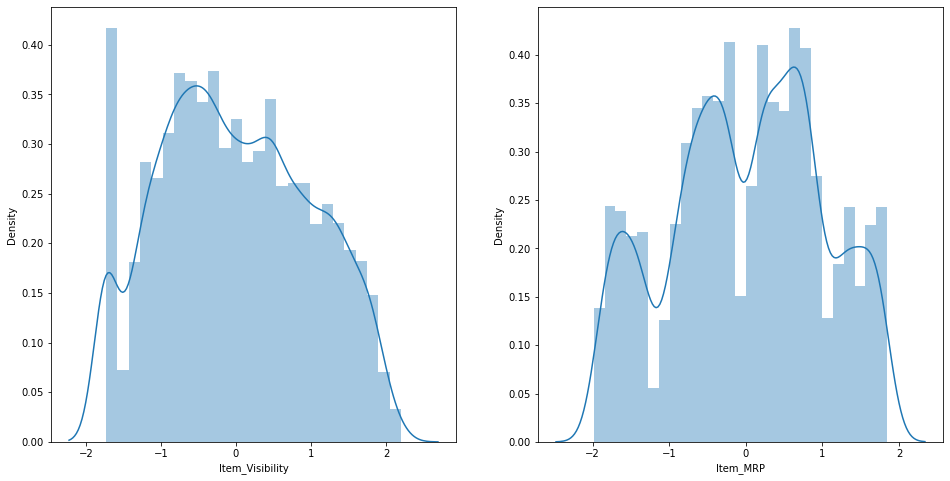

In [42]:
numerical_cols = ['Item_Visibility','Item_MRP']
plotnumber=1
plt.figure(figsize=(16,8))
for col in numerical_cols:
    plt.subplot(1,2, plotnumber)
    sns.distplot(data_new[col])
    plotnumber+=1

In [43]:
data_new.isna().sum()

Item_Identifier                 0
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2368
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

<strong>We Still have missing values in outlet_Size. These will be handled in pandas we will set argument of dummy_na to false</strong>

<h3>Scaling the dataset</h3>

In [44]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

for col in numerical_cols:
    data_new[col] = sc.fit_transform(np.array(data_new[col]).reshape(-1,1)).reshape(8428,)

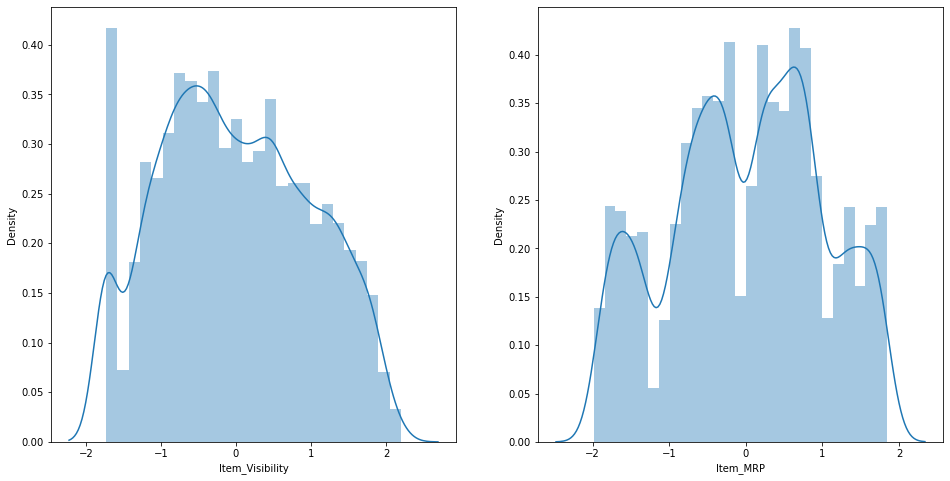

In [45]:
numerical_cols = ['Item_Visibility','Item_MRP']
plotnumber=1
plt.figure(figsize=(16,8))
for col in numerical_cols:
    plt.subplot(1,2, plotnumber)
    sns.distplot(data_new[col])
    plotnumber+=1

In [46]:
data_new[numerical_cols].mean()

Item_Visibility   -1.728302e-17
Item_MRP           5.216520e-18
dtype: float64

<strong>Mean is now close to zero for numerical_cols</strong>

<h3>Encoding using get_dummies</h3>

In [47]:
data_categorical_cols = pd.get_dummies(data_new[categorical_cols], dummy_na=False)

In [48]:
data_new = data_new.join(data_categorical_cols)

In [49]:
data_new.drop(columns=categorical_cols, inplace=True)

In [50]:
data_new.shape

(8428, 1609)

<strong>We now have 8428 rows and 1609 columns</strong>

<h4>MultiCollinearity Using VIF</h4>

In [51]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif["vif"] = [variance_inflation_factor(data_new[numerical_cols].values, i) for i in range(data_new[numerical_cols].shape[1])]
vif["Features"] = data_new[numerical_cols].columns
vif

,vif,Features
0,1.000006,Item_Visibility
1,1.000006,Item_MRP


<strong>No Multicollinearity Problem</strong>

<h3>Building and Training Models</h3>

In [52]:
from sklearn.model_selection import train_test_split, GridSearchCV

X = data_new.drop(columns=['Item_Outlet_Sales'])
y = data_new.Item_Outlet_Sales

In [53]:
isnulls = [1 for i in X.isnull().sum() if i==1]
len(isnulls)

0

In [54]:
y.isnull().sum()

0

In [55]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)

In [56]:
print("Training Shape " ,X_train.shape)
print("Testing Shape", X_test.shape)

Training Shape  (7163, 1608)
Testing Shape (1265, 1608)


<h4>Linear Regression Model</h4>

In [57]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
lr = LinearRegression()
lr.fit(X_train, y_train)

y_pred_train = lr.predict(X_train)
print("________________________________")
print("Training R2 Score :", r2_score(y_train, y_pred_train))
print("Training MSE      :", mean_squared_error(y_train, y_pred_train))
print("Training MAE      :", mean_absolute_error(y_train, y_pred_train))
print("Training RMSE     :", np.sqrt(mean_squared_error(y_train, y_pred_train)))

y_pred_test = lr.predict(X_test)
print("________________________________")
print("Testing R2 Score :", r2_score(y_test, y_pred_test))
print("Testing MSE      :", mean_squared_error(y_test, y_pred_test))
print("Testing MAE      :", mean_absolute_error(y_test, y_pred_test))
print("Testing RMSE     :", np.sqrt(mean_squared_error(y_test, y_pred_test)))

________________________________
Training R2 Score : 0.6564161216487356
Training MSE      : 1013379.8087363478
Training MAE      : 751.145675862069
Training RMSE     : 1006.6676754204179
________________________________
Testing R2 Score : -4.13315809331938e+19
Testing MSE      : 1.094950806398209e+26
Testing MAE      : 559508350336.9077
Testing RMSE     : 10463989709466.504


<strong>This model is clearly overfitting</strong>

<h5>Hyperparameter Tuning</h5>

In [58]:
lr = LinearRegression()

grid_parmas = {
    'fit_intercept':[True, False],
    'normalize':[True, False],
    'positive':[True, False]
}
grid_lr = GridSearchCV(lr, param_grid = grid_parmas, cv=3)
grid_lr.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=LinearRegression(),
             param_grid={'fit_intercept': [True, False],
                         'normalize': [True, False],
                         'positive': [True, False]})

In [59]:
grid_lr.best_score_

0.3978664649903445

In [60]:
grid_lr.best_params_

{'fit_intercept': False, 'normalize': True, 'positive': True}

________________________________
Training R2 Score : 0.6505653544941425
Training MSE      : 1030636.2915740577
Training MAE      : 753.6784615921114
Training RMSE     : 1015.2025864693499
________________________________
Testing R2 Score : 0.4525299716554706
Testing MSE      : 1450350.3990897827
Testing MAE      : 885.6902206681685
Testing RMSE     : 1204.3049443931477


Text(0.5, 1.0, 'Training Data')

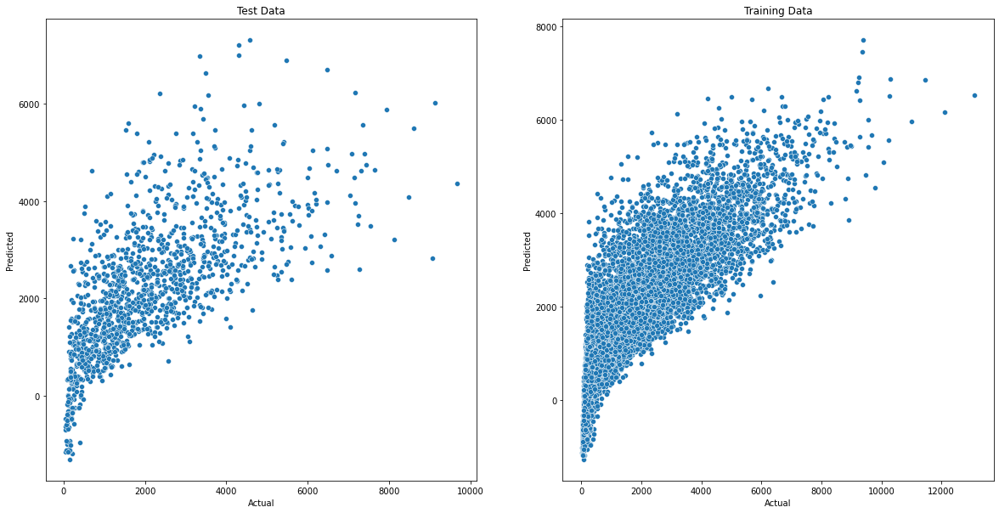

In [61]:
best_model = grid_lr.best_estimator_
best_model.fit(X_train, y_train)

y_pred_train = best_model.predict(X_train)
print("________________________________")
print("Training R2 Score :", r2_score(y_train, y_pred_train))
print("Training MSE      :", mean_squared_error(y_train, y_pred_train))
print("Training MAE      :", mean_absolute_error(y_train, y_pred_train))
print("Training RMSE     :", np.sqrt(mean_squared_error(y_train, y_pred_train)))

y_pred_test = best_model.predict(X_test)
print("________________________________")
print("Testing R2 Score :", r2_score(y_test, y_pred_test))
print("Testing MSE      :", mean_squared_error(y_test, y_pred_test))
print("Testing MAE      :", mean_absolute_error(y_test, y_pred_test))
print("Testing RMSE     :", np.sqrt(mean_squared_error(y_test, y_pred_test)))


plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
sns.scatterplot(y_test,y_pred_test)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Test Data')
plt.subplot(1,2,2)
sns.scatterplot(y_train,y_pred_train)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Training Data')

<h3>Ridge Regression</h3>

In [62]:
from sklearn.linear_model import Ridge

________________________________
Training R2 Score : 0.6524168488041577
Training MSE      : 1025175.4214111061
Training MAE      : 754.7816895942464
Training RMSE     : 1012.5094673192474
________________________________
Testing R2 Score : 0.4840064632772614
Testing MSE      : 1366963.2914454513
Testing MAE      : 870.9714566266019
Testing RMSE     : 1169.1720538250354


Text(0.5, 1.0, 'Training Data')

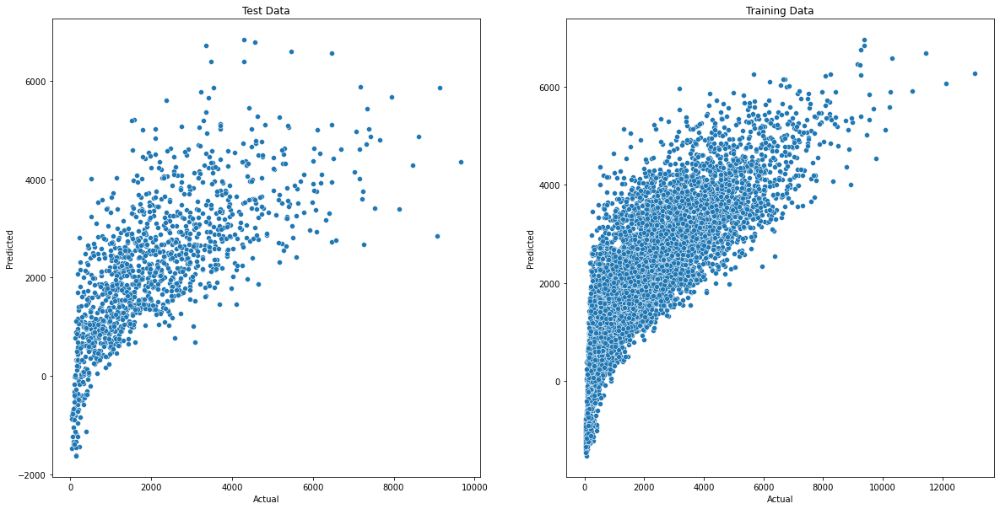

In [63]:
rid = Ridge()
rid.fit(X_train, y_train)

y_pred_train = rid.predict(X_train)
print("________________________________")
print("Training R2 Score :", r2_score(y_train, y_pred_train))
print("Training MSE      :", mean_squared_error(y_train, y_pred_train))
print("Training MAE      :", mean_absolute_error(y_train, y_pred_train))
print("Training RMSE     :", np.sqrt(mean_squared_error(y_train, y_pred_train)))

y_pred_test = rid.predict(X_test)
print("________________________________")
print("Testing R2 Score :", r2_score(y_test, y_pred_test))
print("Testing MSE      :", mean_squared_error(y_test, y_pred_test))
print("Testing MAE      :", mean_absolute_error(y_test, y_pred_test))
print("Testing RMSE     :", np.sqrt(mean_squared_error(y_test, y_pred_test)))


plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
sns.scatterplot(y_test,y_pred_test)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Test Data')
plt.subplot(1,2,2)
sns.scatterplot(y_train,y_pred_train)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Training Data')

<h4>HyperParameter Tuning</h4>

In [64]:
rd = Ridge()

grid_param = {
    'alpha':[0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100],
    'max_iter':np.arange(10, 1000, 50),
    'fit_intercept':[True, False],
    'normalize':[True, False],
}

grid = GridSearchCV(rd, param_grid = grid_param, cv=3, n_jobs=-1)
grid.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=Ridge(), n_jobs=-1,
             param_grid={'alpha': [0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100],
                         'fit_intercept': [True, False],
                         'max_iter': array([ 10,  60, 110, 160, 210, 260, 310, 360, 410, 460, 510, 560, 610,
       660, 710, 760, 810, 860, 910, 960]),
                         'normalize': [True, False]})

In [65]:
grid.best_score_

0.5549397619153725

In [66]:
grid.best_params_

{'alpha': 50, 'fit_intercept': True, 'max_iter': 10, 'normalize': False}

In [67]:
best_model = grid.best_estimator_

________________________________
Training R2 Score : 0.5737364251457556
Training MSE      : 1257238.558543317
Training MAE      : 830.1646454417172
Training RMSE     : 1121.2664975568105
________________________________
Testing R2 Score : 0.5623763118575226
Testing MSE      : 1159346.91926031
Testing MAE      : 803.8225197214523
Testing RMSE     : 1076.7297336194956


Text(0.5, 1.0, 'Training Data')

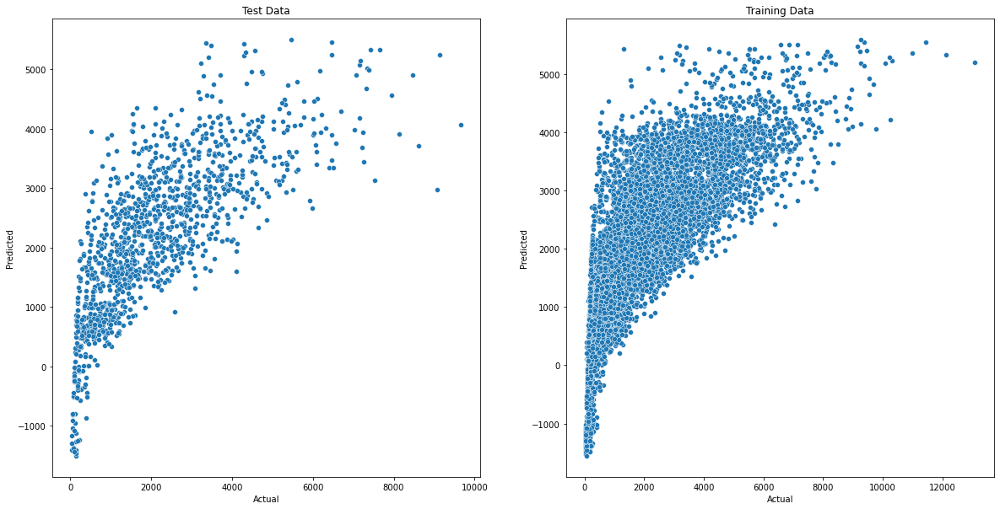

In [68]:
best_model.fit(X_train, y_train)

y_pred_train = best_model.predict(X_train)
print("________________________________")
print("Training R2 Score :", r2_score(y_train, y_pred_train))
print("Training MSE      :", mean_squared_error(y_train, y_pred_train))
print("Training MAE      :", mean_absolute_error(y_train, y_pred_train))
print("Training RMSE     :", np.sqrt(mean_squared_error(y_train, y_pred_train)))

y_pred_test = best_model.predict(X_test)
print("________________________________")
print("Testing R2 Score :", r2_score(y_test, y_pred_test))
print("Testing MSE      :", mean_squared_error(y_test, y_pred_test))
print("Testing MAE      :", mean_absolute_error(y_test, y_pred_test))
print("Testing RMSE     :", np.sqrt(mean_squared_error(y_test, y_pred_test)))


plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
sns.scatterplot(y_test,y_pred_test)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Test Data')
plt.subplot(1,2,2)
sns.scatterplot(y_train,y_pred_train)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Training Data')

<h3>Lasso Regression</h3>

In [69]:
from sklearn.linear_model import Lasso

In [70]:
las = Lasso()

________________________________
Training R2 Score : 0.5616436818518731
Training MSE      : 1292905.3713898845
Training MAE      : 843.4511108287139
Training RMSE     : 1137.059968247007
________________________________
Testing R2 Score : 0.5616684607012419
Testing MSE      : 1161222.149234291
Testing MAE      : 804.581906243256
Testing RMSE     : 1077.6001806023842


Text(0.5, 1.0, 'Training Data')

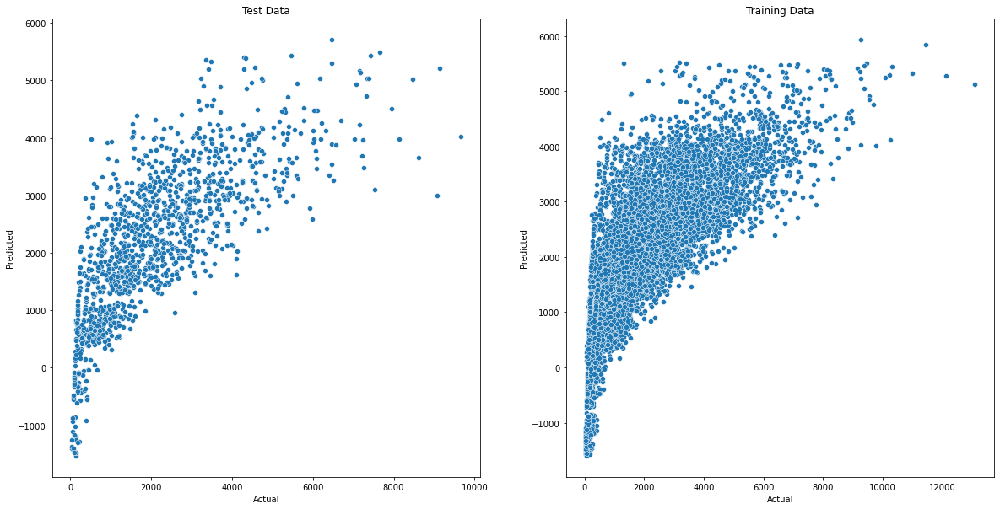

In [71]:
las.fit(X_train, y_train)

y_pred_train = las.predict(X_train)
print("________________________________")
print("Training R2 Score :", r2_score(y_train, y_pred_train))
print("Training MSE      :", mean_squared_error(y_train, y_pred_train))
print("Training MAE      :", mean_absolute_error(y_train, y_pred_train))
print("Training RMSE     :", np.sqrt(mean_squared_error(y_train, y_pred_train)))

y_pred_test = las.predict(X_test)
print("________________________________")
print("Testing R2 Score :", r2_score(y_test, y_pred_test))
print("Testing MSE      :", mean_squared_error(y_test, y_pred_test))
print("Testing MAE      :", mean_absolute_error(y_test, y_pred_test))
print("Testing RMSE     :", np.sqrt(mean_squared_error(y_test, y_pred_test)))


plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
sns.scatterplot(y_test,y_pred_test)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Test Data')
plt.subplot(1,2,2)
sns.scatterplot(y_train,y_pred_train)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Training Data')

<h4>HyperParameter Tuning</h4>

In [72]:
las = Lasso()

grid_param =  {
    'alpha':[0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100],
    'max_iter':np.arange(10, 2000, 100),
    'fit_intercept':[True, False],
    'normalize':[True, False],
}

grid = GridSearchCV(las, param_grid = grid_param, cv=3, n_jobs=-1)
grid.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=Lasso(), n_jobs=-1,
             param_grid={'alpha': [0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100],
                         'fit_intercept': [True, False],
                         'max_iter': array([  10,  110,  210,  310,  410,  510,  610,  710,  810,  910, 1010,
       1110, 1210, 1310, 1410, 1510, 1610, 1710, 1810, 1910]),
                         'normalize': [True, False]})

In [73]:
grid.best_score_

0.5554236423610437

In [74]:
grid.best_params_

{'alpha': 5, 'fit_intercept': False, 'max_iter': 110, 'normalize': True}

________________________________
Training R2 Score : 0.5575416967354601
Training MSE      : 1305003.927680294
Training MAE      : 845.3217206388082
Training RMSE     : 1142.3676849772555
________________________________
Testing R2 Score : 0.5620638129654161
Testing MSE      : 1160174.7872154787
Testing MAE      : 804.3698766076344
Testing RMSE     : 1077.114101298223


Text(0.5, 1.0, 'Training Data')

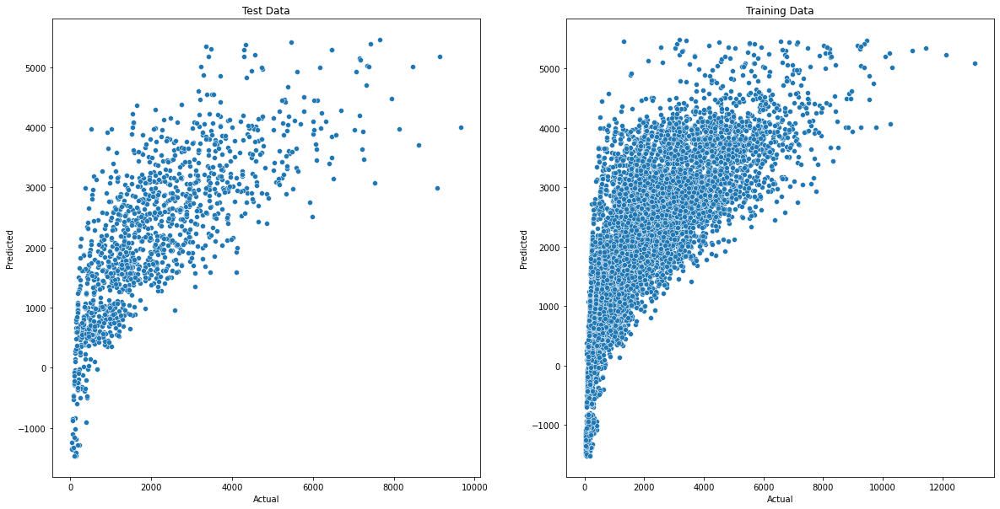

In [75]:
best_model = grid.best_estimator_
best_model.fit(X_train, y_train)

y_pred_train = best_model.predict(X_train)
print("________________________________")
print("Training R2 Score :", r2_score(y_train, y_pred_train))
print("Training MSE      :", mean_squared_error(y_train, y_pred_train))
print("Training MAE      :", mean_absolute_error(y_train, y_pred_train))
print("Training RMSE     :", np.sqrt(mean_squared_error(y_train, y_pred_train)))

y_pred_test = best_model.predict(X_test)
print("________________________________")
print("Testing R2 Score :", r2_score(y_test, y_pred_test))
print("Testing MSE      :", mean_squared_error(y_test, y_pred_test))
print("Testing MAE      :", mean_absolute_error(y_test, y_pred_test))
print("Testing RMSE     :", np.sqrt(mean_squared_error(y_test, y_pred_test)))


plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
sns.scatterplot(y_test,y_pred_test)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Test Data')
plt.subplot(1,2,2)
sns.scatterplot(y_train,y_pred_train)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Training Data')

<h3>AdaBoost Regressor</h3>

________________________________
Training R2 Score : 0.42704325587478587
Training MSE      : 1689901.163471378
Training MAE      : 1035.1531813677939
Training RMSE     : 1299.9619853947183
________________________________
Testing R2 Score : 0.3640805757839598
Testing MSE      : 1684669.3753986852
Testing MAE      : 1033.1624921074292
Testing RMSE     : 1297.9481404889355


Text(0.5, 1.0, 'Training Data')

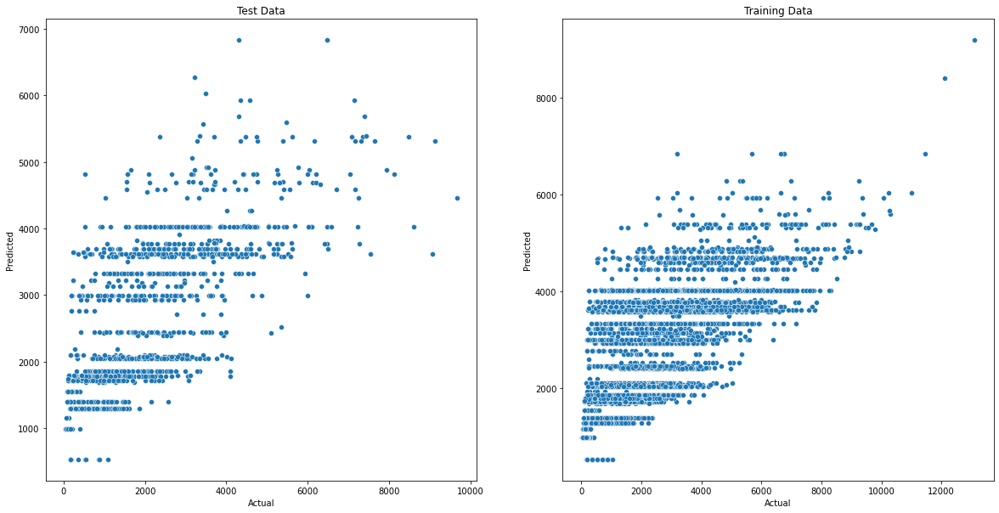

In [77]:
from sklearn.ensemble import AdaBoostRegressor

ad = AdaBoostRegressor()

ad.fit(X_train, y_train)

y_pred_train = ad.predict(X_train)
print("________________________________")
print("Training R2 Score :", r2_score(y_train, y_pred_train))
print("Training MSE      :", mean_squared_error(y_train, y_pred_train))
print("Training MAE      :", mean_absolute_error(y_train, y_pred_train))
print("Training RMSE     :", np.sqrt(mean_squared_error(y_train, y_pred_train)))

y_pred_test = ad.predict(X_test)
print("________________________________")
print("Testing R2 Score :", r2_score(y_test, y_pred_test))
print("Testing MSE      :", mean_squared_error(y_test, y_pred_test))
print("Testing MAE      :", mean_absolute_error(y_test, y_pred_test))
print("Testing RMSE     :", np.sqrt(mean_squared_error(y_test, y_pred_test)))


plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
sns.scatterplot(y_test,y_pred_test)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Test Data')
plt.subplot(1,2,2)
sns.scatterplot(y_train,y_pred_train)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Training Data')

<h4>HyperParameter Tuning</h4>

In [78]:
ada = AdaBoostRegressor()

param_grid ={
    'n_estimators':[10,30,50,100,130],
    'learning_rate':[0.01,0.05,0.1,0.3,0.5]
}

grid  = GridSearchCV(ada, param_grid= param_grid, cv=3, n_jobs=-1)
grid.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=AdaBoostRegressor(), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.05, 0.1, 0.3, 0.5],
                         'n_estimators': [10, 30, 50, 100, 130]})

In [79]:
grid.best_score_

0.569282785728927

In [80]:
grid.best_params_

{'learning_rate': 0.05, 'n_estimators': 100}

________________________________
Training R2 Score : 0.5809530781928535
Training MSE      : 1235953.4781149859
Training MAE      : 815.6410898782857
Training RMSE     : 1111.7344458615041
________________________________
Testing R2 Score : 0.5595142518757481
Testing MSE      : 1166929.0509239144
Testing MAE      : 791.0489014101641
Testing RMSE     : 1080.2449032158931


Text(0.5, 1.0, 'Training Data')

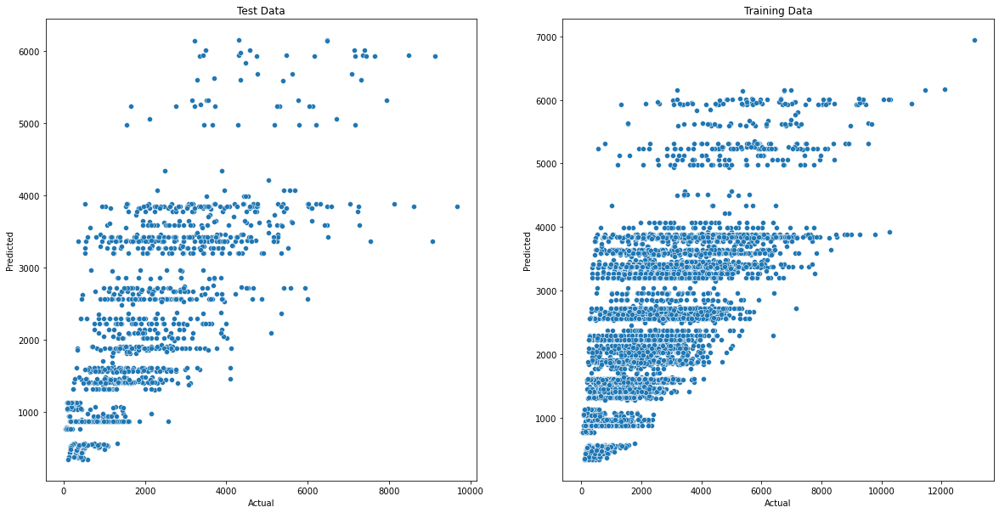

In [81]:
best_model = grid.best_estimator_
best_model.fit(X_train, y_train)

y_pred_train = best_model.predict(X_train)
print("________________________________")
print("Training R2 Score :", r2_score(y_train, y_pred_train))
print("Training MSE      :", mean_squared_error(y_train, y_pred_train))
print("Training MAE      :", mean_absolute_error(y_train, y_pred_train))
print("Training RMSE     :", np.sqrt(mean_squared_error(y_train, y_pred_train)))

y_pred_test = best_model.predict(X_test)
print("________________________________")
print("Testing R2 Score :", r2_score(y_test, y_pred_test))
print("Testing MSE      :", mean_squared_error(y_test, y_pred_test))
print("Testing MAE      :", mean_absolute_error(y_test, y_pred_test))
print("Testing RMSE     :", np.sqrt(mean_squared_error(y_test, y_pred_test)))


plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
sns.scatterplot(y_test,y_pred_test)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Test Data')
plt.subplot(1,2,2)
sns.scatterplot(y_train,y_pred_train)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Training Data')

<h3>XGBRegressor</h3>

________________________________
Training R2 Score : 0.7148010664718771
Training MSE      : 841176.9553839891
Training MAE      : 659.3722881574712
Training RMSE     : 917.1569960393854
________________________________
Testing R2 Score : 0.5526870432679332
Testing MSE      : 1185015.6021803464
Testing MAE      : 763.3227684518372
Testing RMSE     : 1088.5842191490497


Text(0.5, 1.0, 'Training Data')

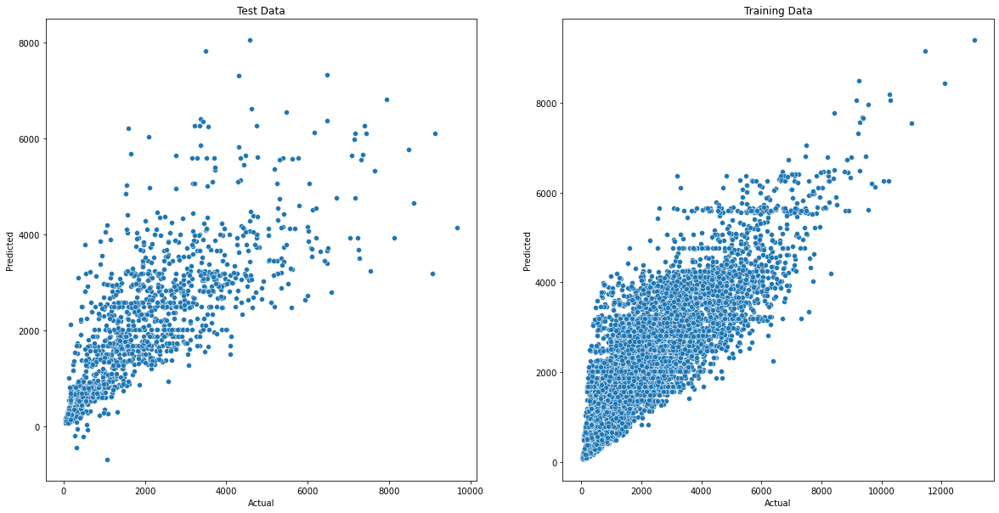

In [83]:
from xgboost import XGBRegressor

xgr =  XGBRegressor()
xgr.fit(X_train, y_train)

y_pred_train = xgr.predict(X_train)
print("________________________________")
print("Training R2 Score :", r2_score(y_train, y_pred_train))
print("Training MSE      :", mean_squared_error(y_train, y_pred_train))
print("Training MAE      :", mean_absolute_error(y_train, y_pred_train))
print("Training RMSE     :", np.sqrt(mean_squared_error(y_train, y_pred_train)))

y_pred_test = xgr.predict(X_test)
print("________________________________")
print("Testing R2 Score :", r2_score(y_test, y_pred_test))
print("Testing MSE      :", mean_squared_error(y_test, y_pred_test))
print("Testing MAE      :", mean_absolute_error(y_test, y_pred_test))
print("Testing RMSE     :", np.sqrt(mean_squared_error(y_test, y_pred_test)))

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
sns.scatterplot(y_test,y_pred_test)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Test Data')
plt.subplot(1,2,2)
sns.scatterplot(y_train,y_pred_train)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Training Data')

<h4>Hyperparameter Tuning</h4>

In [84]:
xg = XGBRegressor()

grid_params = {
    'n_estimators':[20,30,50,100,150],
    'max_depth':[4,5,6,7],
    'learning_rate':[0.01, 0.05, 0.1, 0.3, 0.5],
    'n_jobs':[-1]
}

grid = GridSearchCV(xg, param_grid = grid_params, cv=3, n_jobs=-1, verbose=3)
grid.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


GridSearchCV(cv=3,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    enable_categorical=False, gamma=None,
                                    gpu_id=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight=None,
                                    missing=nan, monotone_constraints=None,
                                    n_estimators=100, n_jobs=None,
                                    num_parallel_tree=None, predictor=None,
                                    random_state=None, reg_alpha=None,
                                    reg_lambda=None, scale_pos_weight=None,
       

In [85]:
grid.best_score_

0.5919814067664719

In [86]:
grid.best_params_

{'learning_rate': 0.3, 'max_depth': 4, 'n_estimators': 20, 'n_jobs': -1}

In [87]:
best_model = grid.best_estimator_

________________________________
Training R2 Score : 0.6258142356232229
Training MSE      : 1103638.215377305
Training MAE      : 745.0763502769256
Training RMSE     : 1050.5418675032922
________________________________
Testing R2 Score : 0.5864100757923738
Testing MSE      : 1095676.9879218864
Testing MAE      : 738.2375874306371
Testing RMSE     : 1046.7459041820448


Text(0.5, 1.0, 'Training Data')

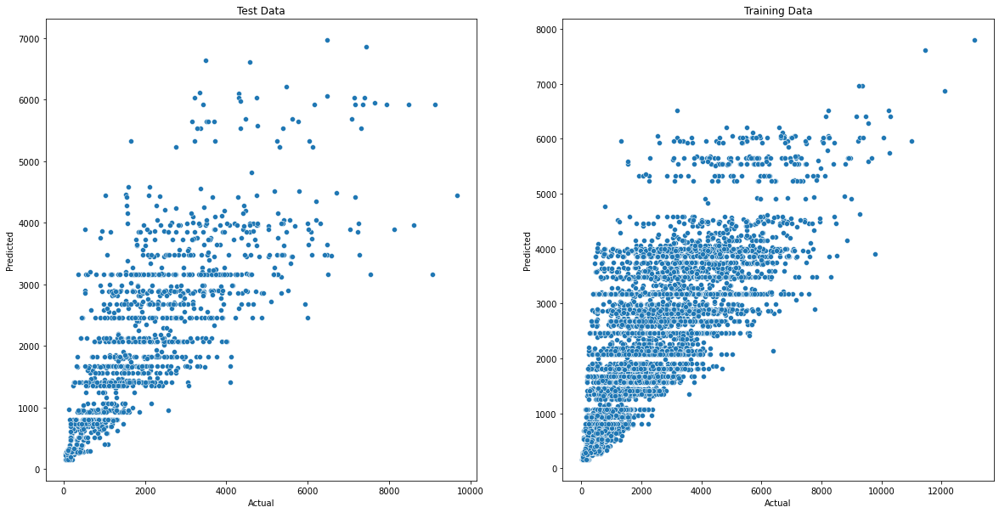

In [88]:
best_model.fit(X_train, y_train)

y_pred_train = best_model.predict(X_train)
print("________________________________")
print("Training R2 Score :", r2_score(y_train, y_pred_train))
print("Training MSE      :", mean_squared_error(y_train, y_pred_train))
print("Training MAE      :", mean_absolute_error(y_train, y_pred_train))
print("Training RMSE     :", np.sqrt(mean_squared_error(y_train, y_pred_train)))

y_pred_test = best_model.predict(X_test)
print("________________________________")
print("Testing R2 Score :", r2_score(y_test, y_pred_test))
print("Testing MSE      :", mean_squared_error(y_test, y_pred_test))
print("Testing MAE      :", mean_absolute_error(y_test, y_pred_test))
print("Testing RMSE     :", np.sqrt(mean_squared_error(y_test, y_pred_test)))


plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
sns.scatterplot(y_test,y_pred_test)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Test Data')
plt.subplot(1,2,2)
sns.scatterplot(y_train,y_pred_train)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Training Data')

<strong>XGBRegressor is the best model till now as it has leat differnence between CV Score and Testing Score</strong>
<strong>Also it has gotten the highest r2 Score</strong>

<h3>Saving Model</h3>

In [90]:
import pickle

filename= 'best_model.pickle'
pickle.dump(best_model,open(filename, 'wb'))

<h3>Training on Full Dataset to make predictions on Testing Data</h3>

In [91]:
final_model = grid.best_estimator_

In [92]:
final_model.fit(X, y)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.3, max_delta_step=0,
             max_depth=4, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=20, n_jobs=-1,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

<h4>Loading the dataset</h4>

In [118]:
X_holdout = pd.read_csv('bigdatamart_Test.csv')

In [119]:
X_holdout = X_holdout.drop(columns=['Item_Weight'])

In [120]:
convert_dict = {
    'Outlet_Establishment_Year':str
}
X_holdout = X_holdout.astype(convert_dict)
X_holdout.shape

(5681, 10)

In [121]:
for col in numerical_cols:
    X_holdout[col] = power_transform(np.array(X_holdout[col]).reshape(-1,1), method='yeo-johnson').reshape(5681,)

In [122]:
for col in numerical_cols:
    X_holdout[col] = sc.fit_transform(np.array(X_holdout[col]).reshape(-1,1)).reshape(5681,)

In [123]:
X_holdout['Item_Fat_Content'] = X_holdout['Item_Fat_Content'].replace({'low fat':'Low Fat', 'LF':'Low Fat', 'reg':'Regular'})

In [124]:
X_holdout_cat = pd.get_dummies(X_holdout[categorical_cols], dummy_na=False)
X_holdout = X_holdout.join(X_holdout_cat)
X_holdout.drop(columns=categorical_cols, inplace=True)
X_holdout.shape

(5681, 1592)

In [125]:
rem_cols = [col for col in X.columns.values.tolist() if col not in  X_holdout.columns.values.tolist()]

In [126]:
rem_cols

['Item_Identifier_DRE49',
 'Item_Identifier_FDA04',
 'Item_Identifier_FDG24',
 'Item_Identifier_FDG33',
 'Item_Identifier_FDL10',
 'Item_Identifier_FDL34',
 'Item_Identifier_FDO19',
 'Item_Identifier_FDO52',
 'Item_Identifier_FDT07',
 'Item_Identifier_FDU19',
 'Item_Identifier_FDW13',
 'Item_Identifier_FDX04',
 'Item_Identifier_FDX20',
 'Item_Identifier_NCL31',
 'Item_Identifier_NCQ06',
 'Item_Identifier_NCY18']

In [127]:
for col in rem_cols:
    X_holdout[col] = [0]*5681

In [128]:
X_holdout.isnull().sum()

Item_Visibility          0
Item_MRP                 0
Item_Identifier_DRA12    0
Item_Identifier_DRA24    0
Item_Identifier_DRA59    0
                        ..
Item_Identifier_FDX04    0
Item_Identifier_FDX20    0
Item_Identifier_NCL31    0
Item_Identifier_NCQ06    0
Item_Identifier_NCY18    0
Length: 1608, dtype: int64

In [129]:
X_holdout.shape

(5681, 1608)

In [130]:
not_in_original  = [col for col in X_holdout.columns if col not in X.columns]

In [131]:
not_in_original

[]

In [132]:
X.shape

(8428, 1608)

<strong>No of cols in now same. Let's make prediction</strong>

In [133]:
y_holdout = final_model.predict(X_holdout)

In [134]:
y_holdout

array([1907.2651, 1173.4713, 3779.54  , ..., 1698.0276, 3389.503 ,
       1173.4713], dtype=float32)

<strong>Saving Final Model</strong>

In [135]:
filename = 'final_model.pickle'
pickle.dump(final_model,open(filename, 'wb'))